# Credit Risk Modeling - Take-Home Assignment


---

## Objective

Build a production-ready modeling workflow to predict the probability of 12-month loan default.

---

## Table of Contents

1. [Setup & Data Loading](#1-setup--data-loading)
2. [Exploratory Data Analysis (EDA)](#2-exploratory-data-analysis-eda)
3. [Data Preprocessing & Feature Engineering](#3-data-preprocessing--feature-engineering)
4. [Model Training](#4-model-training)
5. [Model Evaluation & Comparison](#5-model-evaluation--comparison)
6. [Model Interpretation](#6-model-interpretation)
7. [Discussion & Next Steps](#7-discussion--next-steps)

---


## 1. Setup & Data Loading


In [1]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import (
    roc_auc_score, 
    roc_curve, 
    precision_recall_curve,
    classification_report,
    confusion_matrix,
    recall_score, 
    precision_score, 
    f1_score
)

# Import CatBoost
from catboost import CatBoostClassifier

# Import shap
import shap

# Import KS
from scipy.stats import ks_2samp

# Load preprocessing function from Src
import sys 
from pathlib import Path

proj_root = Path().resolve().parent
sys.path.append(str(proj_root))
from src.preprocessing import (replace_special_missing, impute_categorical, impute_numeric, 
                               apply_winsor, fit_winsor, add_features, build_pipeline)

import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Set visualization style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)


In [2]:
# Load data
df = pd.read_csv('../data/credit_risk_data_enhanced.csv', parse_dates = ['origination_date'])

print(f"Dataset shape: {df.shape}")
print(f"\nFirst few rows:")
df.head()


Dataset shape: (50000, 22)

First few rows:


,loan_id,origination_date,vintage,months_on_book,fico_score,income,debt_to_income,num_open_trades,utilization_rate,inquiries_last_6m,...,apr,channel,product_type,employment_length,state,age,days_past_due_current,total_payments_to_date,sample_weight,default_12m
0,LOAN_000000,2024-03-01,202403,6,738,81758,0.0770,7,0.2484,0,...,7.02,Direct,Personal,28,Other,35,15,26162.66,1.0679,0
1,LOAN_000001,2023-05-01,202305,23,818,21891,0.6960,8,0.5129,99,...,11.90,Direct,Auto,5,IL,35,0,41235.13,1.0211,0
2,LOAN_000002,2022-03-01,202203,1,800,82072,0.1439,10,0.5875,1,...,14.01,Partner,Home_Improvement,9,Other,73,0,16494.83,0.8348,0
3,LOAN_000003,2024-07-01,202407,0,657,40335,0.1670,8,0.2927,1,...,10.88,Direct,Debt_Consolidation,14,Other,22,0,23241.67,1.0255,0
4,LOAN_000004,2021-08-01,202108,9,771,11733,0.0337,3,0.1871,0,...,18.10,Partner,Personal,36,NY,54,0,44836.86,1.0370,0


This notebook originally referenced `credit_risk_data.csv`, but per the README and project structure, the intended modeling dataset is `credit_risk_data_enhanced.csv`. The enhanced dataset includes additional features, multiple vintages, and a more realistic class imbalance. The data loading path was updated accordingly and *origination_date* was parsed to ensure correct data types for downstream analysis.

## 2. Exploratory Data Analysis (EDA)

### 2.1 Basic Data Overview


In [3]:
# Dataset info
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   loan_id                 50000 non-null  object        
 1   origination_date        50000 non-null  datetime64[ns]
 2   vintage                 50000 non-null  int64         
 3   months_on_book          50000 non-null  int64         
 4   fico_score              50000 non-null  int64         
 5   income                  50000 non-null  int64         
 6   debt_to_income          50000 non-null  float64       
 7   num_open_trades         50000 non-null  int64         
 8   utilization_rate        50000 non-null  float64       
 9   inquiries_last_6m       50000 non-null  int64         
 10  loan_amount             50000 non-null  int64         
 11  term                    50000 non-null  int64         
 12  apr                     50000 non-null  float6

In [4]:
# Convert vintage dtype to datetime
df['vintage'] = pd.to_datetime(df['vintage'], format = "%Y%m")
df['vintage'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 50000 entries, 0 to 49999
Series name: vintage
Non-Null Count  Dtype         
--------------  -----         
50000 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 390.8 KB


The *vintage* column represents the month and year of loan origination and is critical for maintaining temporal order when splitting historical loan data into train and test sets. Converting this column's dtype to datetime enables appropriate splitting and prevents look-ahead bias for predicting future loan defaults.

In [5]:
# Summary statistics
df.describe(include = 'all').T


,count,unique,top,freq,mean,min,25%,50%,75%,max,std
loan_id,50000,50000,LOAN_000000,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
origination_date,50000,NaN,NaN,NaN,2022-10-31 02:24:03.456000256,2021-01-01 00:00:00,2021-12-01 00:00:00,2022-11-01 00:00:00,2023-10-01 00:00:00,2024-09-01 00:00:00,NaN
vintage,50000,NaN,NaN,NaN,2022-10-31 02:24:03.456000256,2021-01-01 00:00:00,2021-12-01 00:00:00,2022-11-01 00:00:00,2023-10-01 00:00:00,2024-09-01 00:00:00,NaN
months_on_book,50000.0,NaN,NaN,NaN,12.02132,0.0,6.0,12.0,18.0,24.0,7.235907
fico_score,50000.0,NaN,NaN,NaN,5665.02552,550.0,629.0,708.0,787.0,99999.0,21642.07964
income,50000.0,NaN,NaN,NaN,56864.58896,-1.0,31399.75,47925.0,72374.25,535593.0,38953.183462
debt_to_income,50000.0,NaN,NaN,NaN,0.400049,0.01,0.242175,0.3855,0.5441,0.9747,0.20028
num_open_trades,50000.0,NaN,NaN,NaN,7.9974,0.0,6.0,8.0,10.0,21.0,2.823167
utilization_rate,50000.0,NaN,NaN,NaN,0.49939,0.0019,0.3262,0.5001,0.6725,0.9991,0.223869
inquiries_last_6m,50000.0,NaN,NaN,NaN,3.94382,0.0,1.0,2.0,3.0,99.0,13.651883


The `credit_risk_data_enhanced.csv` dataset contains unique *loan_id* values, indicating that there are no duplicate loan records. Some variables from this output exhibit data quality issues that require further attention.

Missing Data (values confirmed by the README file as nulls)
- `income` has a minimum of `-1` 
- `fico_score` contains a maximum value of `99999`
- `inquiries_last_6m` has a maximum of `99` 

Concerning Data 
- `num_open_trades` contains a maximum of `21` which is very high but plausible, this will be evaluated further during EDA.
- `state` contains only 7 unique values rather than all 50 states. There may be an "other" category or the data may come from 7 unique states.
- `total_payments_to_date` has a minimum value of $0.88, which may indicate a data issue or partial payment.

The objective for this analysis is to predict whether a customer will default within 12 months (1-year) of loan origination. It is critical to use information only known at the time of loan origination and to also exclude any features that cause data leakage. Failure to do so could greatly inflate the performance of the model. With these in mind, care must also be taken in feature selection to ensure compliance with **fair lending** practices and the **Equal Credit Opportunity Act** (ECOA).

**Features that will be excluded from the model**:
- `days_past_due_current`: This information reflects the number of days past due on a payment, and can only be known after loan origination.
- `total_payments_to_date`: This feature reflects total payment that have occured which can only be known after loan origination.
- `months_on_book`: This feature provides the number of months since origination and is a leaky variable that causes look-ahead bias.
- `loan_id`: Unique identifier for the loan.
- `sample_weight`: Weight that measures sample importance. 
- `age`: This variable will be explored through EDA but dropped from the models to prevent age discrimination and help ensure compliance in fair lending.

A note on (APR):    
**Annual Percentage Rate** (APR) is assigned at loan origination and may reflect aspects of internal risk assessment. Since APR is known at decision time, it can be included as a feature for modeling defaults but model predictions should not rely too heavily on signals related to pricing decisions.

In [6]:
# Check for missing values
missing_values = df.isnull().sum()
missing_pct = (missing_values / len(df)) * 100
missing_df = pd.DataFrame({'Missing_Count': missing_values, 'Missing_Percentage': missing_pct})
missing_df[missing_df['Missing_Count'] > 0].sort_values('Missing_Count', ascending=False)


,Missing_Count,Missing_Percentage


The missing values check indicates that the dataset does not contain any traditional `NAN` null values. However, `fico_score`, `income`. and `inquiries_last_6m` use specific values to encode missing information. Missing counts and percentages for these are calculated below.

In [7]:
# Create null dictionary to hold features and null encodings
null_dict = {
    "fico_score": 99999,
    "income": -1,
    "inquiries_last_6m": 99
}

rows = []

for col, val in null_dict.items():
    mask = df[col] == val 

    missing_count = mask.sum()
    missing_percentage = (missing_count / len(df)) * 100

    rows.append({
        "Missing_Count": missing_count,
        "Missing_Percentage": missing_percentage
    })

special_missing_df = pd.DataFrame(rows, index = null_dict.keys())
special_missing_df

,Missing_Count,Missing_Percentage
fico_score,2500,5.0
income,1500,3.0
inquiries_last_6m,1000,2.0


In [8]:
def compare_default_missing(df, col, special_value, target = "default_12m"):
    """ 
    Compares default rates on a column that contains missing data.

    Parameters:
    -----------
    df (pd.DataFrame): credit_risk_data_enhanced DataFrame
    col: Column with missing data
    special_value: Value used to encode missing data in the provided column
    target (default_12m): Target variable that indicates default within 12 months of loan origination
    
    """
    mask = df[col] == special_value 

    print(f"Default Rate by {col.title()} Missing Status:")
    print(df.groupby(mask)[target].mean())
    print()

for col, val in null_dict.items():
    compare_default_missing(df, col = col, special_value = val)

Default Rate by Fico_Score Missing Status:
fico_score
False    0.027832
True     0.041600
Name: default_12m, dtype: float64

Default Rate by Income Missing Status:
income
False    0.027567
True     0.059333
Name: default_12m, dtype: float64

Default Rate by Inquiries_Last_6M Missing Status:
inquiries_last_6m
False    0.027857
True     0.061000
Name: default_12m, dtype: float64



The `compare_default_missing` function compares default rates between loans with missing vs non-missing values for selected features to gauge whether missingness carries a predictive signal.

**Results:**

* Loans with a missing fico score show a higher default rate (4.16%) compared to loans with known fico scores (2.78%).
* Loans with missing income show a noticeably higher default rate (5.93%) compared to loans with reported incomes (2.76%).
* Loans with missing information on credit inquiries from the last 6 months also show a higher default rate (6.10%) compared to non-missing cases (2.79%)

**Observation:**

Across all three features (fico score, income, inquiries_last_6m), the default rates are higher when information is missing. This suggests that missingness is informative and may signal higher-risk borrowers. Based on this pattern, features will be created to flag missingness for the model.

Default Rate: 2.85%

Class Distribution:
default_12m
0    48574
1     1426
Name: count, dtype: int64


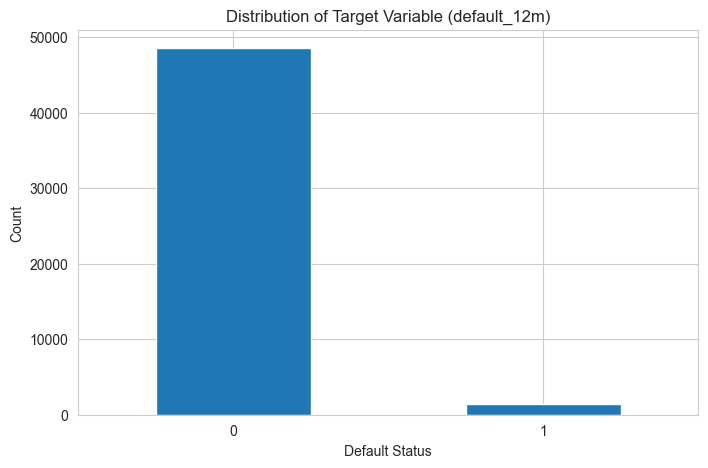

In [9]:
# Target variable distribution
print(f"Default Rate: {df['default_12m'].mean():.2%}")
print(f"\nClass Distribution:")
print(df['default_12m'].value_counts())

# Visualize
plt.figure(figsize=(8, 5))
df['default_12m'].value_counts().plot(kind='bar')
plt.title('Distribution of Target Variable (default_12m)')
plt.xlabel('Default Status')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


This plot confirms that the target variable **default_12m** contains two labels, with 1 indicating that a customer defaulted on a loan within 12 months (1 year) of loan origination. The default rate is approximately 3% with only 1426 borrowers belonging to the positive (default) class. The data is heavily imbalanced which makes metrics like `accuracy` less informative because it will be largely influenced by the dominant class of customers that did not default. The model should instead perform well at correctly labeling the customers who will default within 12 months, even if some customers are misclassified. 

A very simple baseline model that always predicts no defaults would achive 97% accuracy due to the class imbalance alone. The model will need to be evaluated on metrics that measure class separation. Example metrics include:

`Recall (sensitivity)`: Measure of how many defaulters are correctly identified.
`Precision`: Measure of how accurate the model is when it predicts a borrower to default.
`F1-score`: Harmonic mean of Precision and Recall.
`Area Under Curve (AUC)`: Total area under the ROC curve. This metric can take on values between 0 and 1, with a random classifier taking on 0.50 AUC and perfect class separation at 1 AUC.
`Precision-Recall Curve`: Provides insight into the tradeoff between identifying defaulters and minimizing false positives (borrowers incorrectly predicted to default).

### 2.2 Feature Analysis

TODO: Add your EDA analysis here:
- Distribution plots for numerical features
- Correlation analysis
- Outlier detection
- Relationship between features and target variable
- Analysis of categorical variables


In [10]:
# Your EDA code here

# Separate numerical and categorical columns for plotting
num_columns = ["months_on_book", "fico_score", "income", "debt_to_income", "num_open_trades", "utilization_rate", 
                "inquiries_last_6m", "loan_amount", "apr", "employment_length", "age", "days_past_due_current", 
                "total_payments_to_date"
]
cat_columns = ["term", "channel", "product_type", "state", "default_12m"] 


**Note on Excluded Features:**   
Columns such as `months_on_book`, `days_past_due_current`, and `total_payments_to_date` are included in EDA for completeness to better understand the dataset but **will not be used in modeling**. These variables contain post-origination information and would introduce look-ahead bias if included.

Similarly, `age` is included in EDA to examine trends but excluded from the models for fair lending considerations. Age is a protected characteristic and including it could increase regulatory risk.

The `loan_id` column serves as a unique identifier.

The dataset also includes a `sample_weight` column that is described as "sample importance weight" but no additional information about its calculation or intended use was provided. All models will be trained without using sample weights to prevent introducing bias during training.

**Note on Potential Modeling Features:**   
The features listed below are assumed to be known at loan origination, compliant with fair lending practices, and appropriate for modeling without data leakage.

- `apr`
    * The annual percentage rate is assigned at origination and may reflect pricing decisions based on borrower risk. Annual percentage rate is available at decision time and can provide usefule signal but its influence should be considered to ensure that the model doesn't strongly rely on pricing information.

**Candidate Modeling Features**
- `fico_score`
- `income`
- `debt_to_income`
- `num_open_trades`
- `utilization_rate`
- `inquiries_last_6m`
- `loan_amount` 
- `term` 
- `apr` 
- `channel`
- `product_type`
- `employment_length`
- `state`

In [11]:
# Temporal analysis

# Range of loan origination
print("Date Range of Loan Origination:")
print(f"{df["origination_date"].min()} - {df["origination_date"].max()}")
print()

# Number of unique vintages
print("Number of Unique Vintages:")
print(df["vintage"].nunique())

# Distribution of loans per vintage
df["vintage_month"] = df["vintage"].dt.to_period("M")
print()

print("FIRST FEW ROWS OF VINTAGE COLUMNS")
df[["vintage", "vintage_month"]].head()


Date Range of Loan Origination:
2021-01-01 00:00:00 - 2024-09-01 00:00:00

Number of Unique Vintages:
45

FIRST FEW ROWS OF VINTAGE COLUMNS


,vintage,vintage_month
0,2024-03-01,2024-03
1,2023-05-01,2023-05
2,2022-03-01,2022-03
3,2024-07-01,2024-07
4,2021-08-01,2021-08


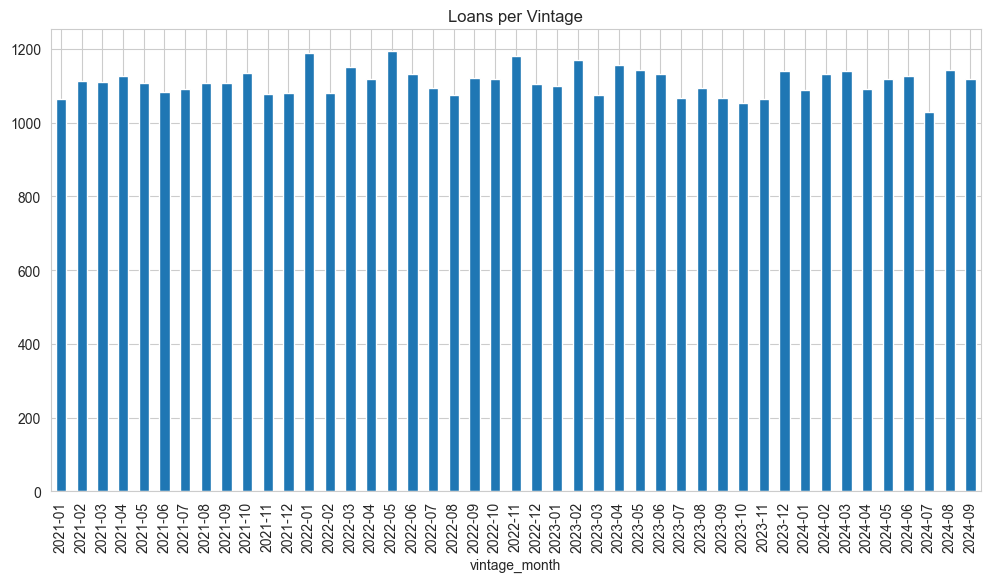

In [12]:
# Plot number of loans per vintage
df["vintage_month"].value_counts().sort_index().plot(kind = "bar", title = "Loans per Vintage")
plt.show()

The distribution of loans across vintages is relatively uniform, indicating that no single origination month dominates the dataset. This is a quick check to see whether there are enough observations in each vintage before the modeling and train-test split phase. Number of defaults and default rates will be analyzed below for any noticeable patterns across vintages.

In [13]:
# Aggregate number of loans, defaults, and default rates by vintage
vintage_info = df.groupby(df["vintage_month"])["default_12m"].agg(
    loans = "size",        # number of loans in vintage
    defaults = "sum",      # number of defaults in vintage
    default_rate = "mean"  # default rate of vintage
)
vintage_info.head()

,loans,defaults,default_rate
vintage_month,,,
2021-01,1064,41,0.038534
2021-02,1112,33,0.029676
2021-03,1111,36,0.032403
2021-04,1127,37,0.032831
2021-05,1108,25,0.022563


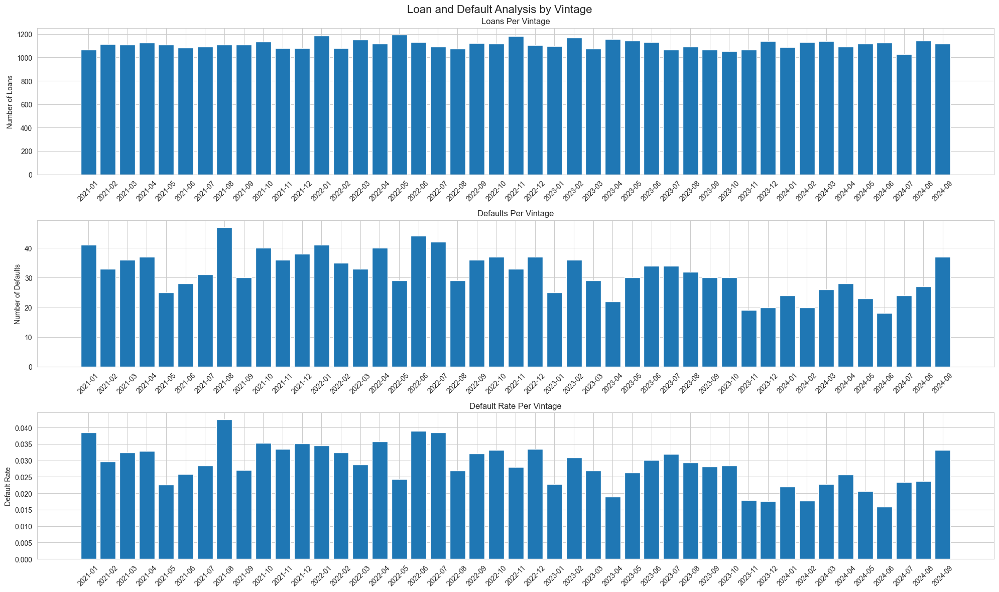

In [14]:
# Plot number of loans, defaults, default rate across vintage
fig, ax = plt.subplots(3, 1, figsize = (20, 12))

ax[0].bar(x = vintage_info.index.astype(str), height = vintage_info["loans"])
ax[0].set_xticklabels(vintage_info.index.astype(str), rotation = 45)
ax[0].set_ylabel("Number of Loans")
ax[0].set_title("Loans Per Vintage")

ax[1].bar(x = vintage_info.index.astype(str), height = vintage_info["defaults"])
ax[1].set_xticklabels(vintage_info.index.astype(str), rotation = 45)
ax[1].set_ylabel("Number of Defaults")
ax[1].set_title("Defaults Per Vintage")

ax[2].bar(x = vintage_info.index.astype(str), height = vintage_info["default_rate"])
ax[2].set_xticklabels(vintage_info.index.astype(str), rotation = 45)
ax[2].set_ylabel("Default Rate")
ax[2].set_title("Default Rate Per Vintage")

plt.suptitle("Loan and Default Analysis by Vintage", fontsize = 16)
plt.tight_layout()
plt.show()

**Vintage Analysis**  
The plots above examing loan volume, default counts, and default rates by vintage from 2021-01 to 2024-09.

**Observations:**
* Loan volume per vintage is relatively uniform across time, ranging between ~1050-1200 loans per month. There are no sparsely populated vintages.
* Default counts fluctuate moderately, with higher defaults observed in earlier vintages (2021 - mid of 2022) and a noticeable decline through late 2023 and onward.
* Default rates display a downward trend over time, decreasing from 3.5%-4% in earlier vintages to 1.5%-2.5%. There is a slight uptick observed in the latest vintage.

**Insights:**
The declining default rate could reflect changing economic conditions, adjustments to existing credit policies, and borrower behavior over time.

**Modeling:**   
* Random data splits would introduce look-ahead bias and inflate performance. 
* A time-based split by vintage will be used, models will be trained on past data to predict future defaults.

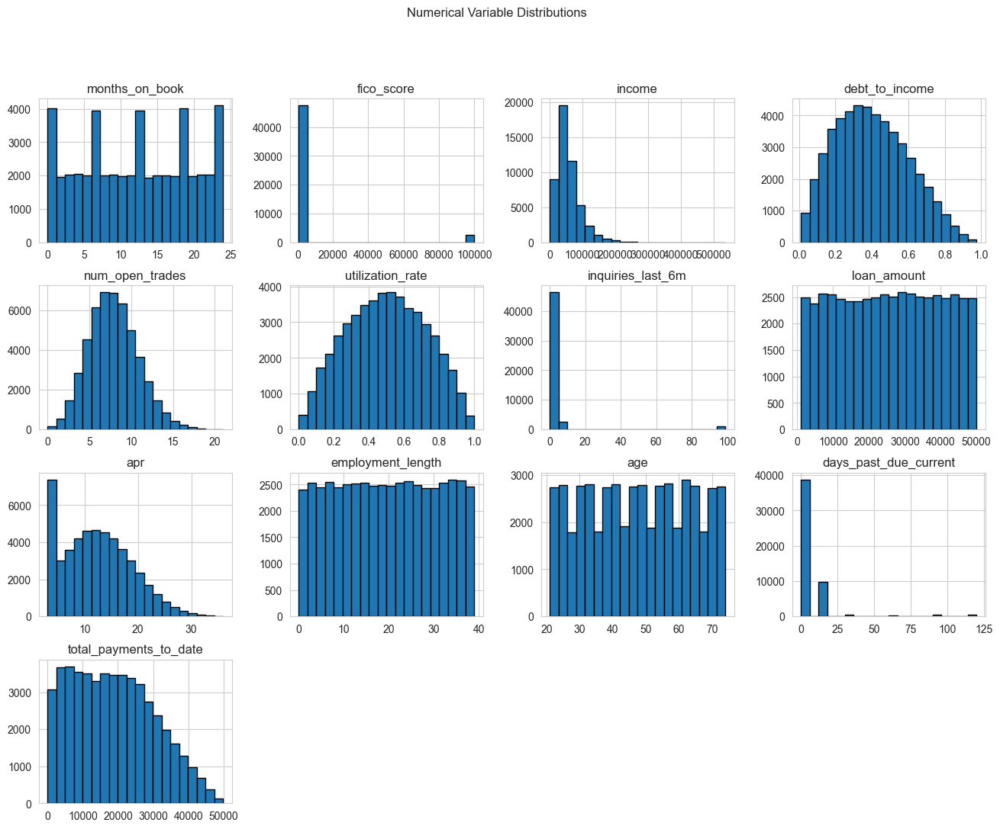

In [15]:
# Distribution plots for numerical variables
df[num_columns].hist(bins = 20, figsize = (16, 12), edgecolor="black")
plt.suptitle("Numerical Variable Distributions")
plt.show()

**Observations on Numerical Variables**:

- **Approximately normally distributed:**
    - `num_open_trades` (centered around~ 7)
    - `utilization_rate` (centered around ~ 0.5)
    - `debt_to_income` (centered around ~0.35, slightly right-skewed)

- **Approximately uniformly distributed:**
    - `loan_amount`
    - `employment_length`

- **Highly skewed variables:**
    - `fico_score` (99999 indicates missing)
    - `income` (-1 indicates missing)
    - `inquiries_last_6m` (99 indicates missing)
    - `days_past_due_current`
    - `total_payments_to_date`
    - `apr` 


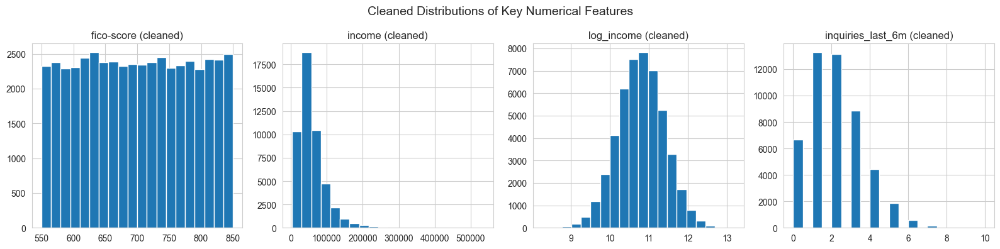

In [16]:
# Clean data anomalies and plot cleaned variables

# Bound fico scores to appropriate range
fico_score_cleaned = df[(df["fico_score"] >= 550) & (df["fico_score"] <= 850)]["fico_score"] 

# Bound income below by 0
income_cleaned = df[df["income"] >= 0]["income"] 

# Log transform income for normality
income_log_cleaned = np.log1p(df[df["income"] >= 0]["income"]) 

# Remove 99 from inquiries
inquiries_last_6m_cleaned = df[df["inquiries_last_6m"] != 99]["inquiries_last_6m"] 

# Plot cleaned variables
fig, ax = plt.subplots(1, 4, figsize = (16, 4))

ax[0].hist(fico_score_cleaned, bins = 20)
ax[0].set_title("fico-score (cleaned)")

ax[1].hist(income_cleaned, bins = 20)
ax[1].set_title("income (cleaned)")

ax[2].hist(income_log_cleaned, bins = 20)
ax[2].set_title("log_income (cleaned)")

ax[3].hist(inquiries_last_6m_cleaned, bins = 20)
ax[3].set_title("inquiries_last_6m (cleaned)")

fig.suptitle("Cleaned Distributions of Key Numerical Features", fontsize=14)
plt.tight_layout()
plt.show()

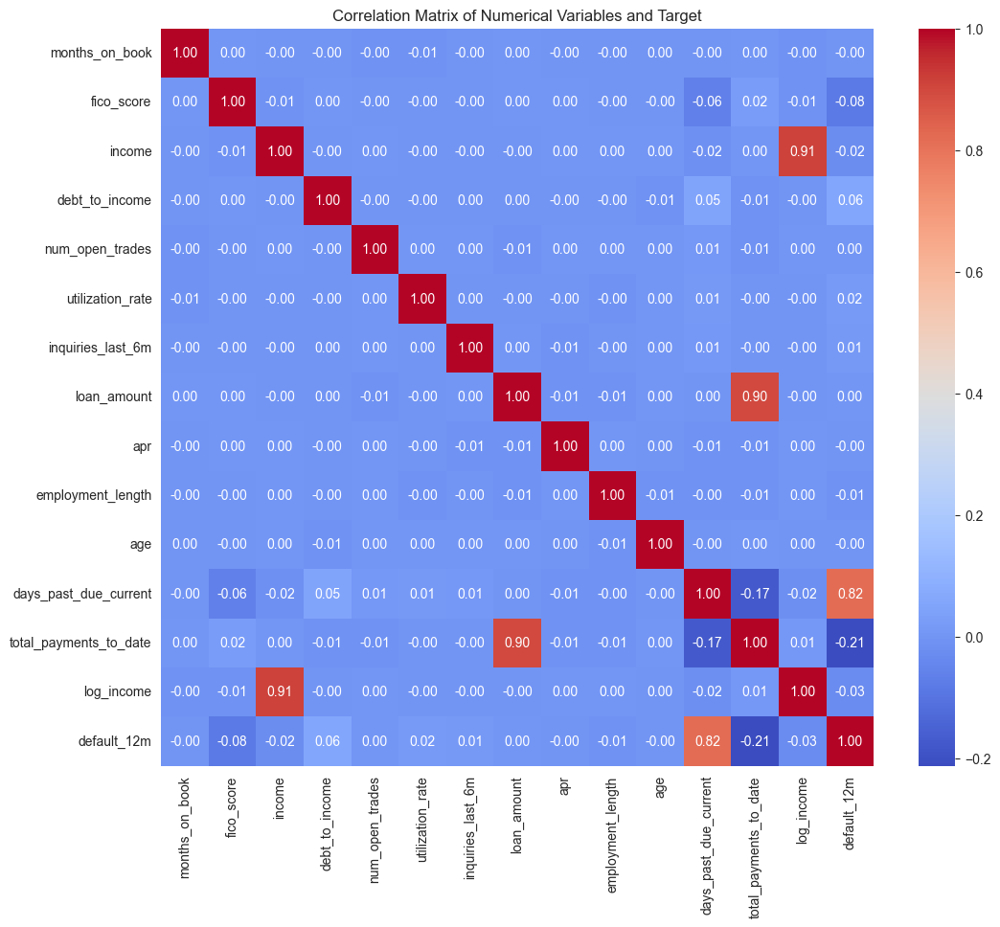

In [17]:
# Correlation Analysis 

df_cleaned = df[(df["fico_score"] >= 550) & 
                (df["fico_score"] <= 850) & 
                (df["income"] >= 0) &
                (df["inquiries_last_6m"] != 99)]

df_cleaned["log_income"] = np.log1p(df["income"]) 

corr_matrix = df_cleaned[num_columns + ["log_income"] + ["default_12m"]].corr()

plt.figure(figsize = (12, 10))
sns.heatmap(corr_matrix, annot = True, fmt = ".2f", cmap = "coolwarm")
plt.title("Correlation Matrix of Numerical Variables and Target")
plt.show()

**Correlation Analysis**

Correlation measures the strength and direction of a linear relationship between two variables, and its value ranges from -1 to 1. Values close to -1 indicate a strong negative linear relationship, while values close to 1 indicate a strong positive linear relationship. Variables that are highly correlated can cause multicollinearity issues in models such as Logisticc Regression, causing coefficient estimates to become unstable. Gradient boosting models are more robust against multicollinearity.

**Observations:**
* `income` and `log_income` are highly correlated (0.91). Only one feature should be used in the Logistic Regression model. Gradient boosting can handle both features.
* `total_payments_to_date` and `loan_amount` are also highly correlated (0.90), but the former is not available at loan origination and would cause data leakage.
* The target `default_12m` is highly correlated with `days_past_due_current` but this variable cannot be used because for the same reasons listed above.

In [18]:
# Outlier Detection
def identify_outliers_iqr(df, columns, thresh = 1.5):
    """ 
    Identifies outliers in numerical columns using the Inner Quartile Range (IQR) rule.
    
    Parameters:
    -----------
    df (pd.DataFrame): Dataframe of numerical columns.
    columns (list): List of numeric columns to check outliers for.
    thresh (float): IQR threshold (default = 1.5).

    Returns:
    --------
    pd.DataFrame: Outlier counts and percentages for each column.
    
    """
    outliers = []

    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1 
        lower_bound = Q1 - thresh * IQR 
        upper_bound = Q3 + thresh * IQR 
        mask = (df[col] < lower_bound) | (df[col] > upper_bound)

        outlier_count = mask.sum()
        outlier_percentage = (outlier_count / len(df)) * 100 

        outliers.append({
            'Numerical_Variable': col,
            'Outlier_Count': outlier_count, 
            'Outlier_Percentage': outlier_percentage
        })
    return pd.DataFrame(outliers).sort_values(by = ["Outlier_Percentage"], ascending = False)

outlier_df = identify_outliers_iqr(df_cleaned, columns = num_columns + ["log_income"])
outlier_df

,Numerical_Variable,Outlier_Count,Outlier_Percentage
11,days_past_due_current,10014,22.174982
2,income,2051,4.541730
13,log_income,320,0.708607
6,inquiries_last_6m,182,0.403020
4,num_open_trades,155,0.343232
8,apr,145,0.321088
5,utilization_rate,0,0.000000
3,debt_to_income,0,0.000000
0,months_on_book,0,0.000000
1,fico_score,0,0.000000


**Outlier Analysis (IQR Method)**

The table above shows the proportion of outliers detected in numerical variables using the IQR rule on cleaned data.

**Observations:**
* `days_past_due_current` shows a high outlier percentage (~22%) which is plausible since most borrowers are current, with some that are slightly delinquent, and fewer that are severely delinwuent.
* `income` shows a moderate number of outliers that are also observed in its right-skewed distribution. 
* Most origination features show little to no outliers.

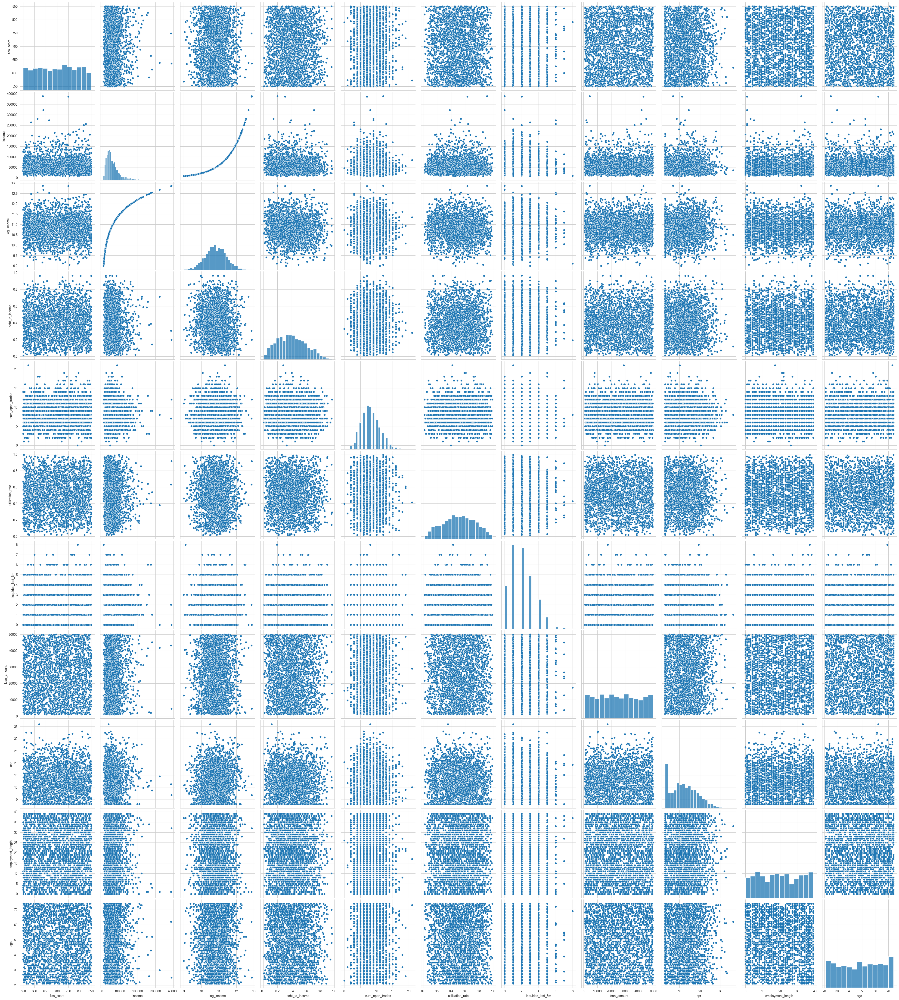

In [19]:
# Relationship between Features and Target
eda_features = ["fico_score", "income", "log_income", "debt_to_income", "num_open_trades", 
                "utilization_rate", "inquiries_last_6m", "loan_amount", "apr", 
                "employment_length", "age"]

sample_df = df_cleaned[eda_features].sample(n = 2500, random_state = RANDOM_STATE)

sns.pairplot(sample_df, 
             height = 4,
             aspect = .9)
plt.show()

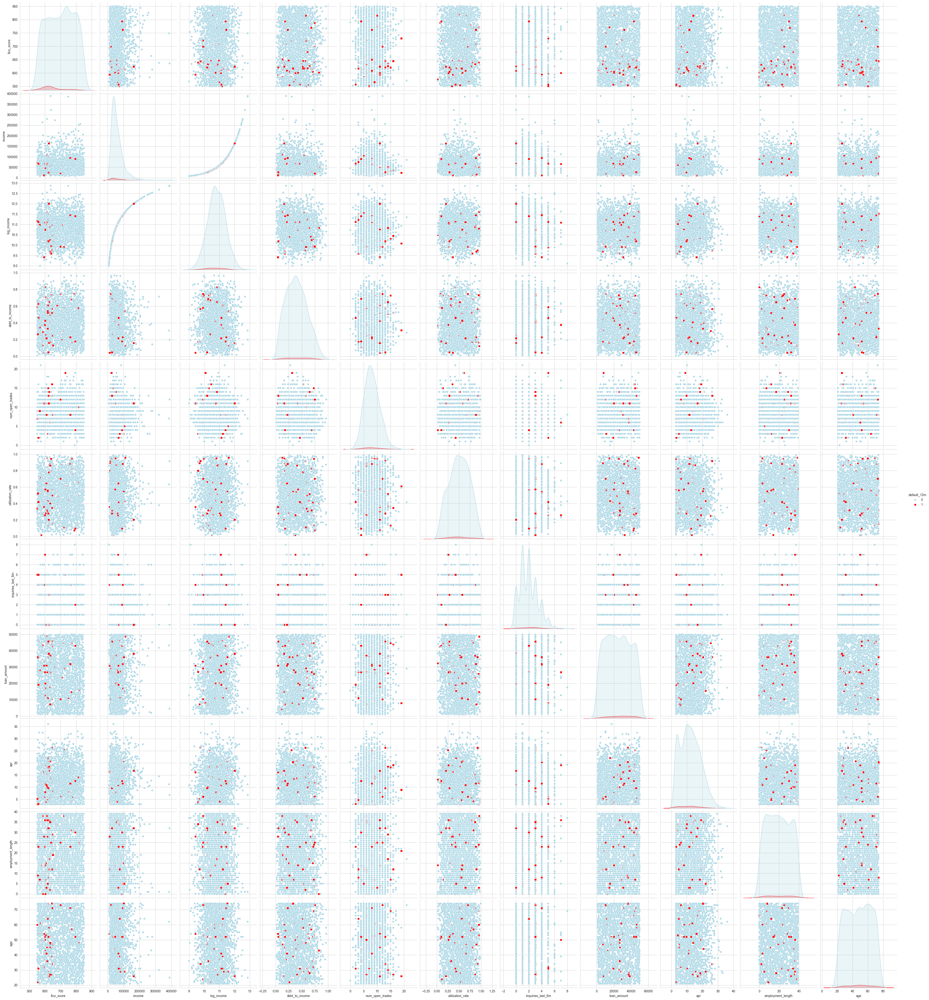

In [20]:
sample_df = df_cleaned[eda_features + ["default_12m"]].sample(n = 2500, random_state = RANDOM_STATE)

palette = {
    0: "lightblue", 
    1: "red"
}

sns.pairplot(sample_df, 
             hue = "default_12m", 
             palette = palette, 
             diag_kind = "kde", 
             height = 4,
             aspect = .9,
             markers = ["o", "s"]
)
plt.show()

**Feature-Target Relationships**

Pairplot visualizations of selected columns were generated on random sample of 2500 observations with points colored by default status (red).

**Observations:**
* Defaults are more concentrated at lower fico scores which aligns with expectation since lower credit scores are indicate higher credit risk.
* Aside from fico scores, most feature pairs show weak or no clear linear separation between default and non-default loans.

In [21]:
# Analysis of Categorical Variables
for col in cat_columns:
    # Display unique categorical values
    print(f"{col}: {df[col].unique()}")

term: [36 60]
channel: ['Direct' 'Partner' 'Mail']
product_type: ['Personal' 'Auto' 'Home_Improvement' 'Debt_Consolidation' 'Business']
state: ['Other' 'IL' 'NY' 'CA' 'TX' 'FL' 'GA']
default_12m: [0 1]


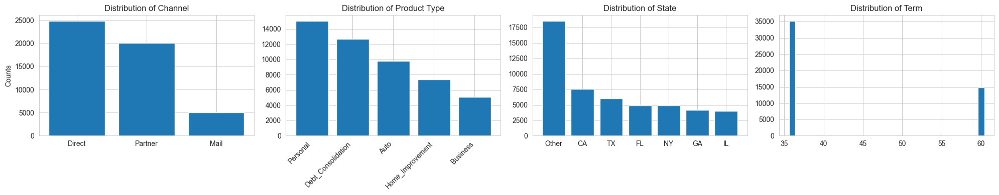

In [22]:
# Plot distribution of categorical Variables
fig, ax = plt.subplots(1, 4, figsize = (20, 4))

ax[0].bar(x = df["channel"].value_counts().index, height = df["channel"].value_counts())
ax[0].set_ylabel("Counts")
ax[0].set_title("Distribution of Channel")

ax[1].bar(x = df["product_type"].value_counts().index, height = df["product_type"].value_counts())
ax[1].set_xticklabels(labels = df["product_type"].value_counts().index, rotation = 45, ha = 'right')
ax[1].set_title("Distribution of Product Type")

ax[2].bar(x = df["state"].value_counts().index, height = df["state"].value_counts())
ax[2].set_title("Distribution of State")

ax[3].bar(x = df["term"].value_counts().index, height = df["term"].value_counts())
ax[3].set_title("Distribution of Term")

plt.tight_layout()
plt.show()

**Observations on Categorical Variables**

* `channel`
    * Most loans are opened through 'Direct' and 'Partner' channels with 'Mail' being the least common.
* `product_type`
    * Majority of loans are requested for personal use or debt consolidation.
* `state`
    * Borrower state is known at loan origination but it may not be a strong predictor of default on its own.
    * California, Texas, Florida, New York, Georgia, and Illinois are represented, with the remaining states labeled as 'Other'.
* `term`
    * 36-month loans are significantly more common that 60-month loans.

In [23]:
def default_rate_by_cat(df, column):
    """  
    Compute default rates and counts for each category of a given categorical variable.

    Parameters:
    -----------
    df (pd.DataFrame): Dataframe containing categorical columns.
    column (str): Name of the categorical column to analyze.

    Returns:
    --------
    (pd.DataFrame) A dataframe indexed by unique categorical values with 
                    - default_rate: Default rate for that category.
                    - count: Number of rows in that category.

    """
    return df.groupby(column)["default_12m"].agg(
        default_rate = "mean",
        count = "size"
    ).sort_values("default_rate", ascending = False)

In [24]:
# Default rate by channel
default_rate_by_cat(df, "channel")

,default_rate,count
channel,,
Direct,0.029013,24851
Mail,0.028667,5058
Partner,0.027873,20091


In [25]:
# Default rate by product type
default_rate_by_cat(df, "product_type")

,default_rate,count
product_type,,
Home_Improvement,0.030984,7391
Personal,0.029240,15048
Auto,0.027820,9813
Business,0.027734,5084
Debt_Consolidation,0.027085,12664


In [26]:
# Default rate by state
default_rate_by_cat(df, "state")

,default_rate,count
state,,
GA,0.032297,4118
FL,0.031001,4903
TX,0.030238,6052
NY,0.028536,4871
Other,0.028158,18538
IL,0.028000,4000
CA,0.024608,7518


In [27]:
# Default rate by term
default_rate_by_cat(df, "term")

,default_rate,count
term,,
36,0.029035,35164
60,0.027298,14836


## 3. Data Preprocessing & Feature Engineering

`**Reordered Data Preprocessing & Feature Engineering**`

**Original steps for Preprocessing:**  
* 3.1 Handle Missing Values
* 3.2 Handle Outliers
* 3.3 Feature Engineering
* 3.4 Encode Categorical Features
* 3.5 Train/Test Split

**Reordered steps for Preprocessing:**
* `3.1 Train/Test Split`
* `3.2 Handle Missing Values`
* `3.3 Handle Outliers`
* `3.4 Feature Engineering`
* `3.5 Encode Categorical Features`

### 3.1 Train/Test Split


In [28]:
# Split data
TRAIN_END = "2022-06"                     
VAL_START, VAL_END = "2022-07", "2023-06" 
TEST_START = "2023-07"                    

# Train set
train_df = df[df["vintage_month"] <= TRAIN_END]

# Val set
val_df = df[(df["vintage_month"] >= VAL_START) & (df["vintage_month"] <= VAL_END)]

# Test set
test_df = df[df["vintage_month"] >= TEST_START]

The dataset is split into train, validation, and test sets first to ensure that there is no data leakage in the later preprocessing steps. These sets are determined by the vintage, and not assigned with random splits. This ensures that the model is trained on past loan data and evaluated on future loans.

`Train (Jan 2021 - Jun 2022)`: ~ 18 months of loans used to fit models   
`Validation (Jul 2022 - Jun 2023)`: ~ 12 months used to tune hyperparameters and evaluate performance during development   
`Train (Jul 2023 - Sep 2024)`: ~ 15 months for final evaluation of model generalization

### 3.2 Handle Missing Values 


In [29]:
# Your preprocessing code here
null_dict = {
    "fico_score": 99999,
    "income": -1,
    "inquiries_last_6m": 99
}

NUM_FEATURES = ["fico_score", "income", "debt_to_income", "num_open_trades", 
            "utilization_rate", "inquiries_last_6m", "loan_amount", "apr", 
            "employment_length", "age"]

CAT_FEATURES = ["channel", "state", "product_type"] 

# 1. Replace null dictionary values as NANs on all splits
train_df = replace_special_missing(train_df, null_dict)
val_df = replace_special_missing(val_df, null_dict)
test_df = replace_special_missing(test_df, null_dict)

# 2. Impute numeric columns

# Fit median values on train
train_impute_vals = train_df[NUM_FEATURES].median()

# Impute train, val, test
train_df = impute_numeric(train_df, NUM_FEATURES, train_impute_vals)
val_df = impute_numeric(val_df, NUM_FEATURES, train_impute_vals)
test_df = impute_numeric(test_df, NUM_FEATURES, train_impute_vals)

# 3. Impute categorical columns with "Unknown"
train_df = impute_categorical(train_df, CAT_FEATURES)
val_df = impute_categorical(val_df, CAT_FEATURES)
test_df = impute_categorical(test_df, CAT_FEATURES)


Some columns in this dataset contain special values to indicate missing data. 

* fico_score = 99999
* income = -1
* inquiries_last_6m = 99

These values are replaced with NaN for imputation strategies. Additionally, flag features are created to capture whether a value was originally missing (*_missing feature). These features encode missingness and can carry predictive information as observed in the early stages of EDA.

**Imputation Strategy:**
* Numeric features - missing values are filled with the median value calculated from the train set.
* Categorical features - missing values are filled with "Unknown"

This ensures that all datasets (train_df, val_df, test_df) are consistently processed and prevents data leakage by using values calculated from train_df.

### 3.3 Handle Outliers


In [30]:
# Your outlier handling code here

# Fit winsorization function on train (calculate cutoffs on numerical features)
winsor_cutoffs = fit_winsor(train_df, NUM_FEATURES, lower = .01, upper=.99)

# Apply to all splits
train_df = apply_winsor(train_df, winsor_cutoffs)
val_df = apply_winsor(val_df, winsor_cutoffs)
test_df = apply_winsor(test_df, winsor_cutoffs)

Winsorization is applied on numerical features to cap extreme values at the 1st and 99th percentiles.

* The 1st and 99th percentiles of each numeric feature are calculated from the train set (train_df). This ensures that information from val and test do not leak into the model.
* The cutoffs calculated from train are then applied with the 'apply_winsor' function to all data splits using the clip method. Values below the lower bound are set to the 1st percentile and values above the upper bound are set to the 99th percentile. 
* This preprocessing helps reduce the effect of extreme outliers while preserving most of the feature distribution.

### 3.4 Feature Engineering


In [31]:
# Your feature engineering code here

# Create log_income, loan_to_income, util_trades features
train_df = add_features(train_df)
val_df = add_features(val_df)
test_df = add_features(test_df)

New features are created to help the model capture non-linear relationships and interactions between numeric variables:

* `log_income`: Log transformed income to reduce skewness.
* `loan_to_income`: Ratio of loan amount to income to represent borrower's leverage.
* `util_trades`: Interaction between utilization rate and the number of open trades to capture the effect of debt usage and account activity.

### 3.5 Encode Categorical Variables


In [32]:
# Your encoding code here
NUM_MODEL_FEATURES = [
    "fico_score", "debt_to_income", "num_open_trades", 
    "utilization_rate", "inquiries_last_6m", "loan_amount", "apr", 
    "employment_length", "log_income", "util_trades", "loan_to_income",
    "fico_score_missing", "income_missing", "inquiries_last_6m_missing"]

#, "income_emp_length" _missing are categorical but they will be treated as numerical for modeling to prevent _1, _2
#] rem age

CAT_MODEL_FEATURES = [
    "channel", "state", "product_type"
]

ORD_MODEL_FEATURES = [
    "term"
]

TARGET = ["default_12m"]

MODEL_FEATURES = NUM_MODEL_FEATURES + CAT_MODEL_FEATURES + ORD_MODEL_FEATURES

# Create pipeline
pipeline = build_pipeline(num_features = NUM_MODEL_FEATURES, 
                          cat_features = CAT_MODEL_FEATURES, 
                          ord_features = ORD_MODEL_FEATURES,
                          model = None)

# Fit and transform train
preprocessor = pipeline.named_steps["preprocess"]
X_train_enc = preprocessor.fit_transform(train_df[MODEL_FEATURES])
X_train_enc.columns = [col.replace("num__", "").replace("cat__", "") for col in X_train_enc.columns]

# View first few rows of X_train
X_train_enc.head()

,fico_score,debt_to_income,num_open_trades,utilization_rate,inquiries_last_6m,loan_amount,apr,employment_length,log_income,util_trades,...,state_GA,state_IL,state_NY,state_Other,state_TX,product_type_Business,product_type_Debt_Consolidation,product_type_Home_Improvement,product_type_Personal,ord__term
2,800.0,0.143900,10,0.5875,1.0,17564.0,14.01,9,11.315364,5.8750,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,771.0,0.042022,3,0.1871,0.0,46939.0,18.10,36,9.442897,0.5613,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,687.0,0.321800,8,0.6067,3.0,11803.0,14.31,4,10.534280,4.8536,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
10,804.0,0.742400,11,0.1109,1.0,5042.0,16.31,31,10.871972,1.2199,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
15,596.0,0.272900,8,0.4634,5.0,49058.0,19.51,2,11.166441,3.7072,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


Categorical variables need to be encoded before they can be used in machine learning models. 

The preprocessing pipeline is responsible only for feature encoding, and assumes that missing value handling, outlier treatment and feature engineering have already been applied consistently across all data splits.

The `preprocessing pipeline` applies the following transformation:

* Numeric features: Passed through without further transformation. 
* Categorical features: One-hot encoding using `OneHotEncoder`. Unknown categories are ignored at inference.
* Ordinal features: term is encoded using `OrdinalEncoder` to preserve the natural order of loan terms (36 months < 60 months)

`X_train_enc` is created to verify that the preprocessing pipeline works as intended on the training data. The full pipeline with the model can automatically apply the same transformations at inference.

In [33]:
# Set y_train, y_val, y_test
y_train, y_val, y_test = train_df["default_12m"], val_df["default_12m"], test_df["default_12m"]

In [34]:
y_train.head()

2     0
4     0
9     0
10    0
15    0
Name: default_12m, dtype: int64

In [35]:
X_train_enc.columns

Index(['fico_score', 'debt_to_income', 'num_open_trades', 'utilization_rate',
       'inquiries_last_6m', 'loan_amount', 'apr', 'employment_length',
       'log_income', 'util_trades', 'loan_to_income', 'fico_score_missing',
       'income_missing', 'inquiries_last_6m_missing', 'channel_Mail',
       'channel_Partner', 'state_FL', 'state_GA', 'state_IL', 'state_NY',
       'state_Other', 'state_TX', 'product_type_Business',
       'product_type_Debt_Consolidation', 'product_type_Home_Improvement',
       'product_type_Personal', 'ord__term'],
      dtype='object')

## 4. Model Training

### 4.1 Model 1: Logistic Regression


In [36]:
# Train logistic regression model
log_reg = LogisticRegression(
    penalty = "l2", 
    solver = "liblinear",
    class_weight = "balanced", # account for class imb and better optimization
    max_iter = 1000,
    random_state = RANDOM_STATE
)

log_reg_pipeline = build_pipeline(
    num_features = NUM_MODEL_FEATURES, 
    cat_features = CAT_MODEL_FEATURES, 
    ord_features = ORD_MODEL_FEATURES,
    model = log_reg
)

log_reg_pipeline.fit(train_df[MODEL_FEATURES], y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('preprocess', ...), ('model', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('cat', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers

The `Logistic Regression` model is trained using L2 regularization and class weighting to account for severe class imbalance. L2 regularization helps to reduce overfitting while balanced weighting applies more weight on the minority default class.

VALIDATION PERFORMANCE - DEFAULT THRESHOLD: 0.50
              precision    recall  f1-score   support

           0       0.98      0.63      0.77     13078
           1       0.05      0.64      0.09       390

    accuracy                           0.63     13468
   macro avg       0.52      0.64      0.43     13468
weighted avg       0.96      0.63      0.75     13468



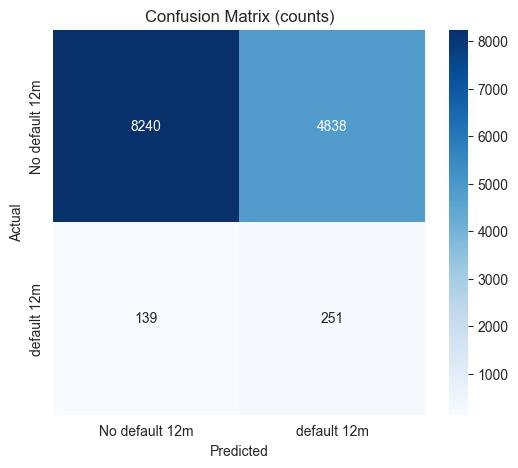

In [37]:
# Check model performance on Validation set

# Predict target for validation set
y_val_pred = log_reg_pipeline.predict(val_df[MODEL_FEATURES])

# Print classification report
print("VALIDATION PERFORMANCE - DEFAULT THRESHOLD: 0.50")
print(classification_report(y_val, y_val_pred))

# Display confusion matrix
cm = confusion_matrix(y_val, y_val_pred)

plt.figure(figsize = (6,5))
sns.heatmap(cm, annot = True, fmt = "d", cmap = "Blues", xticklabels = ["No default 12m", "default 12m"], yticklabels = ["No default 12m", "default 12m"])
plt.title("Confusion Matrix (counts)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

Despite severe class imbalance, the `Logistic Regression` model achieves 64% recall on the positive class (default_12m) because it correctly identifies 251 out of 390 defaulters in the validation set.

However, there is also a high false-positive rate. Approximately 37%, 4838 non-defaulters, are incorrectly classified as defaults, resulting in a precision of only 5% for the positive class. This indicates that when the model predicts a default, it is correct roughly only 1 in 20 times.

While the model is effective at identifying defaulters, the large number of false positives could lead to many declined loans that would have otherwise been repaid. These missed opportunities would likely have a negative impact with respect to business cost. To better balance recall and precision, the validation set will be used to optimize the classification threshold and model performance will be re-evaluated.

In [38]:
# Threshold optimization
thresholds = np.arange(0, 1.001, 0.01)  
best_f1 = -1
best_threshold = 0
recall_scores, precision_scores, f1_scores = [], [], []

# Predict probability of positive class
y_proba = log_reg_pipeline.predict_proba(val_df[MODEL_FEATURES])[:, 1] 

for threshold in thresholds:
    y_pred_thresh = (y_proba > threshold).astype(int)
    
    precision = precision_score(y_val, y_pred_thresh, zero_division = 0)
    recall = recall_score(y_val, y_pred_thresh)
    f1 = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    recall_scores.append(recall)
    precision_scores.append(precision)
    f1_scores.append(f1)

    if f1 >= best_f1:
        best_f1 = f1
        best_threshold = threshold
        print(f"Threshold={threshold:.2f} Recall={recall:.2f} Precision={precision:.2f} F1={f1:.3f}")
print(f"Best Threshold: {best_threshold}")

Threshold=0.00 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.01 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.02 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.03 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.04 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.05 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.06 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.07 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.08 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.09 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.10 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.11 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.12 Recall=1.00 Precision=0.03 F1=0.056
Threshold=0.13 Recall=1.00 Precision=0.03 F1=0.057
Threshold=0.14 Recall=1.00 Precision=0.03 F1=0.057
Threshold=0.15 Recall=1.00 Precision=0.03 F1=0.057
Threshold=0.16 Recall=1.00 Precision=0.03 F1=0.057
Threshold=0.17 Recall=1.00 Precision=0.03 F1=0.058
Threshold=0.18 Recall=0.99 Precision=0.03 F1=0.058
Threshold=0.19 Recall=0.99 Prec

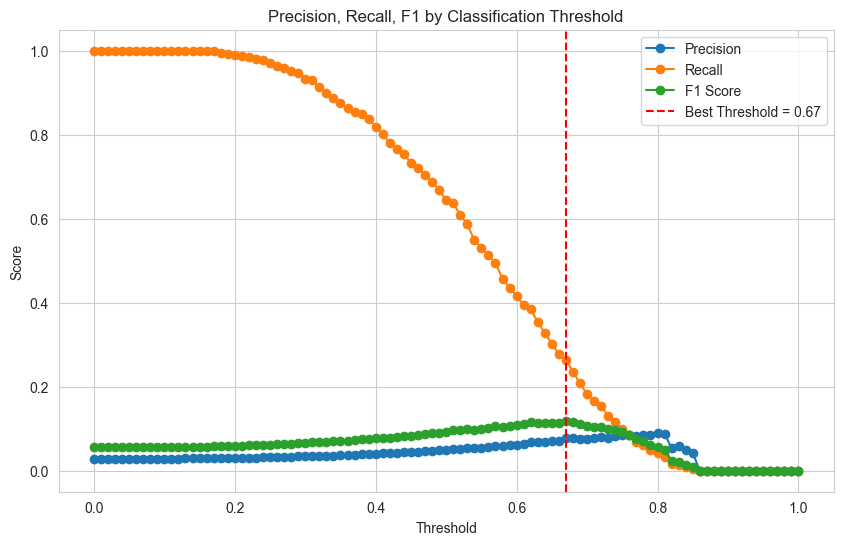

In [39]:
plt.figure(figsize = (10, 6))
plt.plot(thresholds, precision_scores, label = "Precision", marker = "o")
plt.plot(thresholds, recall_scores, label = "Recall", marker = "o")
plt.plot(thresholds, f1_scores, label = "F1 Score", marker = "o")

plt.axvline(best_threshold, color = "red", linestyle = "--", label = f"Best Threshold = {best_threshold:.2f}")

plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision, Recall, F1 by Classification Threshold")
plt.legend()
plt.grid(True)
plt.show()

VALIDATION PERFORMANCE - OPTIMIZED THRESHOLD: 0.67
              precision    recall  f1-score   support

           0       0.98      0.91      0.94     13078
           1       0.08      0.26      0.12       390

    accuracy                           0.89     13468
   macro avg       0.53      0.58      0.53     13468
weighted avg       0.95      0.89      0.92     13468



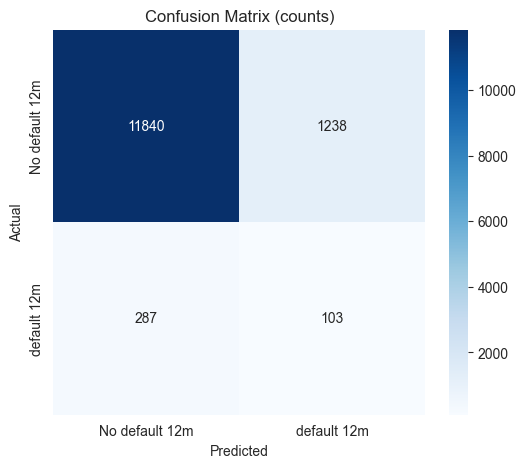

In [40]:
# Predict default_12m for validation set
y_val_pred = (log_reg_pipeline.predict_proba(val_df[MODEL_FEATURES])[:, 1] >= best_threshold).astype(int)

# Print classification report
print(f"VALIDATION PERFORMANCE - OPTIMIZED THRESHOLD: {best_threshold:.2f}")
print(classification_report(y_val, y_val_pred))

# Display confusion matrix
cm = confusion_matrix(y_val, y_val_pred)

plt.figure(figsize = (6,5))
sns.heatmap(cm, annot = True, fmt = "d", cmap = "Blues", xticklabels = ["No default 12m", "default 12m"], yticklabels = ["No default 12m", "default 12m"])
plt.title("Confusion Matrix (counts)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

The classification threshold was optimized for F1-score, the harmonic mean of precision and recall. With the new threshold, the `Logistic Regression` model predicts fewer false positives in the validation set (from 4838 to 1238) but this comes at the cost of recall. The model now identifies fewer defaulters (from 251 to 103). This tradeoff highlights the challenges of modeling with highly imbalanced data, where improving precision often reduces the recall and vice versa.

### 4.2 Model 2: Gradient Boosting / XGBoost / LightGBM


In [41]:
# Train gradient boosting model

# Specify categorical features for CatBoost
categ_features = [
    "channel", "state", "product_type"
]

# Optimize depth, learning_rate, and threshold
best_f1 = -1
best_params = None
best_thresh = 0

# Apply grid search for hyperparameter tuning on val_df
# auto_class_weight = 'Balanced'
for depth in [3, 4, 5]:
    for lr in [0.001, 0.01, 0.05]:
        model = CatBoostClassifier(
            iterations = 3000,
            depth = depth,
            learning_rate = lr,
            eval_metric = "AUC",
            loss_function = "Logloss",
            random_seed = RANDOM_STATE,
            auto_class_weights = 'Balanced',
            verbose = 0,
            use_best_model = True
        )
        model.fit(
            train_df[MODEL_FEATURES],
            y_train,
            eval_set = (val_df[MODEL_FEATURES], y_val),
            cat_features = categ_features,
            early_stopping_rounds = 150)
        
        y_proba = model.predict_proba(val_df[MODEL_FEATURES])[:, 1]
        
        for thresh in np.arange(0, 1.05, .05):
            y_val_pred = (y_proba > thresh).astype(int)
            f1 = f1_score(y_val, y_val_pred)
            if f1 > best_f1:
                best_f1 = f1
                best_params = {"depth": depth, "learning_rate": lr}
                best_threshold = thresh
            
print(f"Best params: {best_params}, Best Threshold: {best_threshold}, Best F1: {best_f1}")

Best params: {'depth': 4, 'learning_rate': 0.01}, Best Threshold: 0.65, Best F1: 0.12521942656524282


The `CatBoost Classifier` natively handles categorical features, so the categorical pipeline encoder was replaced by cat_features. Numeric preprocessing (winsorization, imputation, and feature engineering) were previously fit on the train set and applied to all datasets prior to training CatBoost.

The tree depth and learning rate hyperparameters are tuned by grid search using the validation set. Class weights are also set to balanced to help reduce the effect of severe class imbalance. The eval set is used to monitor validation performance during training and trigger early stopping if there is no improvement. Lastly, the classification threshold is optimized for F1-score using validation.

In [42]:
# Set CatBoost hyperparameters 
catboost_model = CatBoostClassifier(
    iterations = 3000,
    learning_rate = 0.01,
    depth = 4,
    eval_metric = "AUC",
    loss_function = "Logloss",
    random_seed = RANDOM_STATE, 
    auto_class_weights = "Balanced",
    verbose = 100,
)

# Train CatBoost model
catboost_model.fit(
    train_df[MODEL_FEATURES],
    y_train,
    eval_set = (val_df[MODEL_FEATURES], y_val),
    use_best_model = True,
    cat_features = categ_features,
    early_stopping_rounds = 150
)

0:	test: 0.6734757	best: 0.6734757 (0)	total: 51.3ms	remaining: 2m 33s
100:	test: 0.7030945	best: 0.7032342 (99)	total: 6.22s	remaining: 2m 58s
200:	test: 0.7092385	best: 0.7092385 (200)	total: 12.5s	remaining: 2m 54s
300:	test: 0.7125729	best: 0.7126152 (297)	total: 19.1s	remaining: 2m 51s
400:	test: 0.7147404	best: 0.7147404 (400)	total: 25.7s	remaining: 2m 46s
500:	test: 0.7158042	best: 0.7158042 (500)	total: 32.2s	remaining: 2m 40s
600:	test: 0.7158658	best: 0.7161624 (515)	total: 38.9s	remaining: 2m 35s
700:	test: 0.7167461	best: 0.7168627 (675)	total: 46s	remaining: 2m 30s
800:	test: 0.7167837	best: 0.7169353 (752)	total: 53.1s	remaining: 2m 25s
900:	test: 0.7164920	best: 0.7169353 (752)	total: 1m	remaining: 2m 20s
Stopped by overfitting detector  (150 iterations wait)

bestTest = 0.716935272
bestIteration = 752

Shrink model to first 753 iterations.


VALIDATION PERFORMANCE - THRESHOLD OPTIMIZED: 0.65
              precision    recall  f1-score   support

           0       0.98      0.91      0.94     13078
           1       0.08      0.27      0.13       390

    accuracy                           0.89     13468
   macro avg       0.53      0.59      0.53     13468
weighted avg       0.95      0.89      0.92     13468



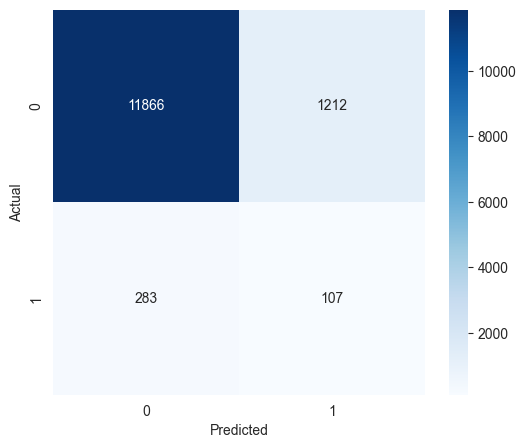

In [43]:
# Calculate probability of positive class
y_val_proba = catboost_model.predict_proba(val_df[MODEL_FEATURES])[:, 1]

best_thresh = 0.65
y_val_pred = (y_val_proba > best_thresh).astype(int)

# Print classification report
print(f"VALIDATION PERFORMANCE - THRESHOLD OPTIMIZED: {best_threshold}")
print(classification_report(y_val, y_val_pred))

# Display confusion matrix
cm = confusion_matrix(y_val, y_val_pred)

plt.figure(figsize = (6,5))
sns.heatmap(cm, annot = True, fmt = "d", cmap = "Blues")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

Similar to Logistic Regression, the classiciation threshold for CatBoost was optimized on the validation set to maximize the F1-score. Evaluation on validation data above shows that CatBoost delivers a modest but consistent improvement over the tuned Logistic Regression model. However, threshold tuning and class weighting do not seem to be sufficient for handling the severe class imbalance. Improved model performance would likely come from additional engineered features and down-sampling. 

## 5. Model Evaluation & Comparison

### 5.1 Calculate Metrics (AUC, KS, Precision-Recall)


In [ ]:
# Calculate and compare metrics
def compute_test_ks(model):
    y_proba = model.predict_proba(test_df[MODEL_FEATURES])[:, 1]
    proba_def = y_proba[y_test == 1]
    proba_nondef = y_proba[y_test == 0]
    ks_stat, p_value = ks_2samp(proba_def, proba_nondef)
    return round(ks_stat, 3)

def compute_test_metrics(y_true, y_proba, threshold):
    y_pred = (y_proba >= threshold).astype(int)

    # Calculate Test ROC AUC
    roc_auc = roc_auc_score(y_true, y_proba)

    # Calculate Test Precision
    precision = precision_score(y_true, y_pred)

    # Calculate Test Recall
    recall = recall_score(y_true, y_pred)

    # Calculate Test F1
    f1 = f1_score(y_true, y_pred)

    return {
        "ROC_AUC": roc_auc,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1,
        "Threshold": threshold
    }

In [45]:
# Logistic Regression
log_reg_proba = log_reg_pipeline.predict_proba(test_df[MODEL_FEATURES])[:, 1]
log_reg_metrics = compute_test_metrics(y_test, log_reg_proba, threshold = 0.67)

# CatBoost Classifier
cb_proba = catboost_model.predict_proba(test_df[MODEL_FEATURES])[:, 1]
cb_metrics = compute_test_metrics(y_test, cb_proba, threshold = 0.65)

# Dataframe of evaluation metrics
pd.DataFrame([log_reg_metrics, cb_metrics], 
              index = ["LogisticRegression", "CatBoost"])

,ROC_AUC,Precision,Recall,F1-score,Threshold
LogisticRegression,0.672142,0.048083,0.201531,0.077641,0.67
CatBoost,0.698264,0.058376,0.234694,0.093496,0.65


In [46]:
print("Logistic Regression KS:", compute_test_ks(log_reg_pipeline))
print("CatBoost KS:", compute_test_ks(catboost_model))


Logistic Regression KS: 0.277
CatBoost KS: 0.31


**Test Set Performance Summary**   
Both models were evaluated on a held-out test set using threshold-independent and threshold-dependent metrics to account for the extreme class imbalance (~3% default rate)

`CatBoost` demonstrates stronger performance overall:
* ROC AUC ~ 0.70 (vs 0.67 for Logistic Regression)
* KS Statistic 0.31 (vs .28) indicating improved separation between defaulters and non-defaulters

Classification thresholds were optimized on the validation set to maximize F1-score and applied to the test set for final evaluation. 

Under the optimized thresholds, CatBoost achieves:
* Higher recall of defaulters (0.235 vs 0.202)
* Slightly higher precision
* Increase in F1-score as a result of the improvements above

While precision and F1-score remain relatively low for both models due to severe class imbalance, the performance metrics on test reveal that CatBoost is more effective than Logistic Regression.

### 5.2 ROC Curves


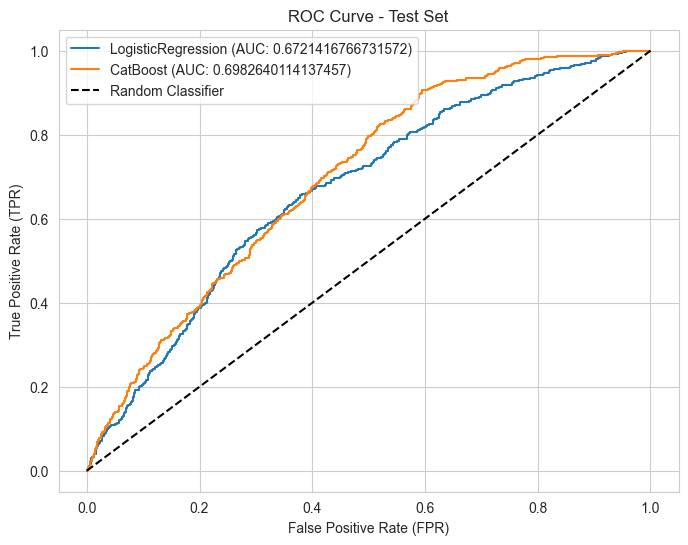

In [47]:
# Plot ROC curves

# Logistic Regression
fpr_lr, tpr_lr, t = roc_curve(y_test, log_reg_proba)
auc_lr = roc_auc_score(y_test, log_reg_proba)

# Catboost
fpr_cb, tpr_cb, t = roc_curve(y_test, cb_proba)
auc_cb = roc_auc_score(y_test, cb_proba)

plt.figure(figsize = (8,6))
plt.plot(fpr_lr, tpr_lr, label = f"LogisticRegression (AUC: {auc_lr})")
plt.plot(fpr_cb, tpr_cb, label = f"CatBoost (AUC: {auc_cb})")
plt.plot([0,1], [0,1], "k--", label = "Random Classifier")
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve - Test Set")
plt.legend(loc = "upper left")
plt.grid(True)
plt.show()

### 5.3 Precision-Recall Curves


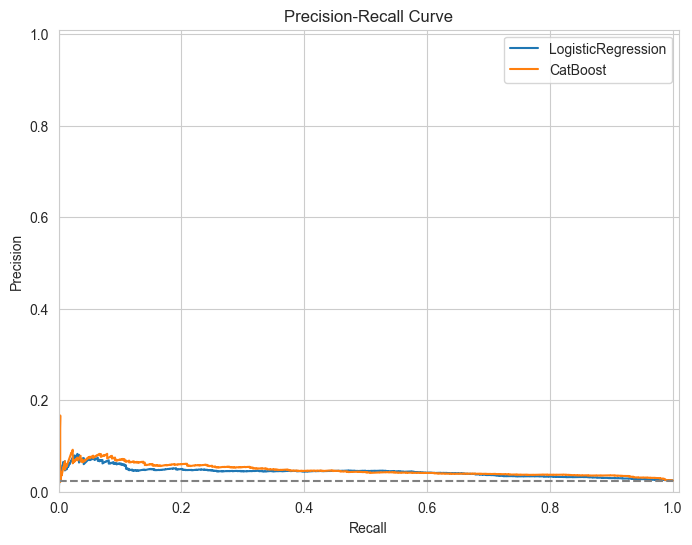

In [48]:
# Plot precision-recall curves

# Logistic Regression
lr_precision, lr_recall, t = precision_recall_curve(y_test, log_reg_proba)

# CatBoost
cb_precision, cb_recall, t = precision_recall_curve(y_test, cb_proba)

baseline = y_test.mean()

plt.figure(figsize = (8,6))

plt.plot(lr_recall, lr_precision, label = "LogisticRegression")
plt.plot(cb_recall, cb_precision, label = "CatBoost")
plt.hlines(baseline, xmin = 0, xmax = 1, linestyle = "dashed", color = "grey")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.xlim([0, 1.01])
plt.ylim([0, 1.01])
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()

The ROC curves compar model performance acrss all possible classification thresholds. Both models perform better than a random classifier (AUC = 0.50). CatBoost is closer to the top left edge of the plot and chieves a higher AUC vs Logistic Regression. 

Because loan defaults are rare, Precision-Recall curves are typically preferred and provide a more informative view of model performance. Both models outperform the baseline default rate but precision remains low at higher levels of recall due to the imbalance. CatBoost demonstrates slightly better precision-recall tradeoffs across most recall levels which indicate modest improvement over Logistic Regression.

## 6. Model Interpretation

### 6.1 Feature Importance


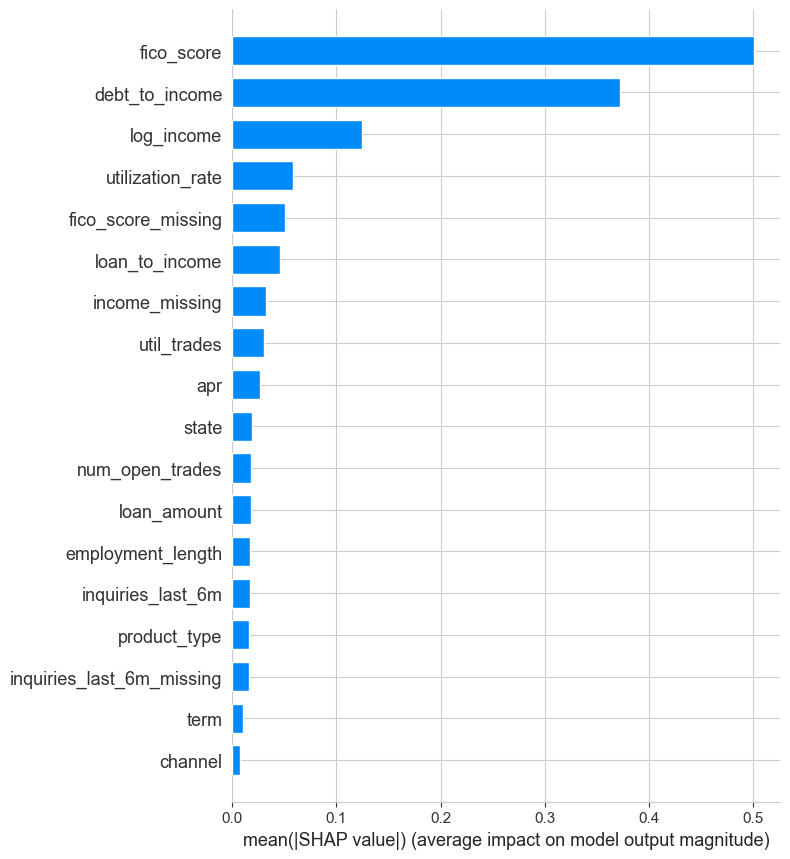

In [49]:
# Analyze feature importance

#CatBoost
expl_cb = shap.TreeExplainer(catboost_model)
shap_values_cb = expl_cb.shap_values(train_df[MODEL_FEATURES])
shap.summary_plot(
    shap_values_cb,
    train_df[MODEL_FEATURES],
    plot_type = "bar"
)

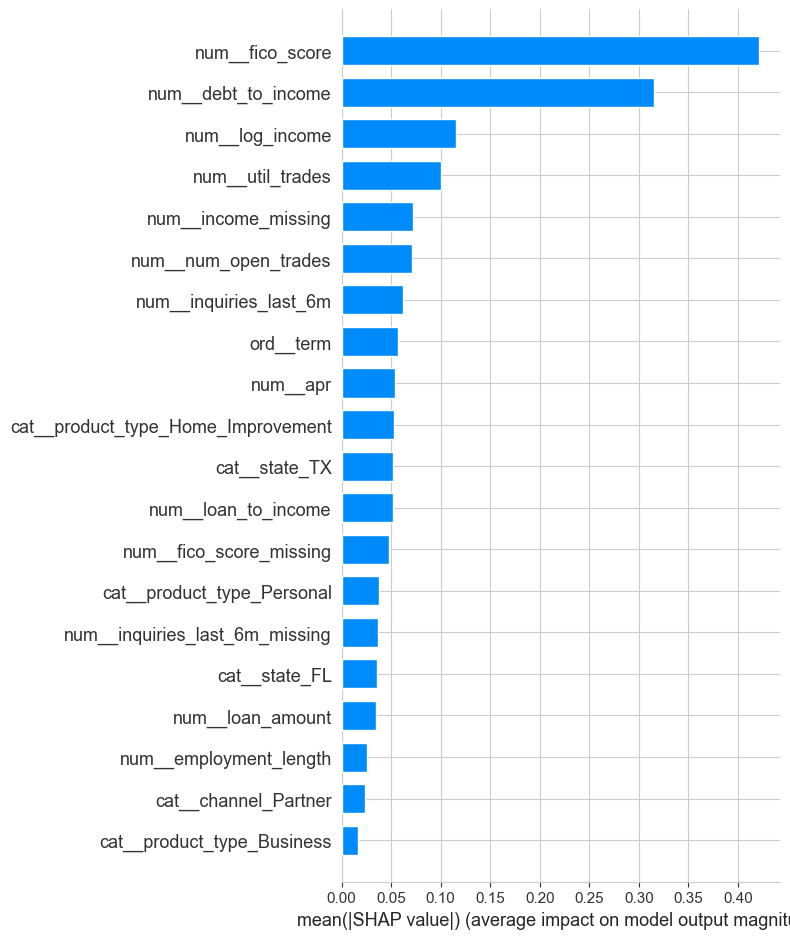

In [50]:
# Logistic Regression
log_reg_model = log_reg_pipeline.named_steps["model"]
expl_lr = shap.LinearExplainer(
    log_reg_model,
    X_train_enc
)
shap_values_lr = expl_lr.shap_values(X_train_enc)
shap.summary_plot(
    shap_values_lr,
    X_train_enc,
    plot_type = "bar",
    feature_names = log_reg_pipeline["preprocess"].get_feature_names_out()
)

### 6.2 Key Drivers of Default


`Key Drivers of Default`:

To gauge feature importance, SHAP (mean absolute value) is applied to the Logistic Regression and CatBoost models. SHAP helps quantify how significant each predictor is by measuring its contribution towards a prediciton. Features that are more influential have a higher mean absolute SHAP value. The top four significant features for prediciton are listed below for each model.

**CatBoost**
* fico_score
* debt_to_income
* log_income
* utilization_rate

**Logistic Regression**
* fico_score
* debt_to_income
* log_income
* util_trades


## 7. Discussion & Next Steps

### 7.1 Model Assumptions

TODO: Discuss assumptions made by your models:
- Logistic Regression assumptions (linearity, independence, etc.)
- Tree-based model assumptions
- Any data assumptions

`Model Assumptions`:   
**Logistic Regression**
* Linearity in the log-odds
    * The Logistic Regression model assumes that there is a linear relationship between the predictors and the log-odds of default. 
* Independence of observations
    * Each loan is assumed to be independent with no repeat borrowers in time, or borrowers listed on multiple loans.
* Limited multicollinearity
    * Multicollinearity can cause unstable coefficients in Logistic Regression but regularization can help mitigate this.
* Binary response
    * The target is a binary variable, 1 indicates that a borrower defaulted within 12 months of loan origination and 0 if they did not.

**Tree-based Assumptions**:   
Tree-based models do not make assumptions about the data or its underlying distribution so they are a type of non-parametric model.

**Data Assumptions**:   
Assumptions about the data include:
* No target (default_12m) leakage and post-origination information is excluded.
* Class imbalance (3% default rate) reflects real portfolio behavior.
* Relationships learned from the train cutoff persist into validation and test periods.
* Loans are fully observed over 12 month time span and correctly labeled.
* Loans are independent (each loan_id corresponds to one unique borrower)
* There is an assumption that historical relationships between borrower and default risk are relatively stable over time but changes in economic conditions could influence model performance.

### 7.2 Potential Data Leakage

TODO: Discuss potential sources of data leakage:
- Features that might contain information about the target
- Temporal considerations
- Other leakage risks

`Potential Data Leakage`:   
Any variable that provided post-origination information was excluded to reduce the effect of data leakage 
    * days_past_due_current: This information reflects the number of days past due on a payment, and can only be known after loan origination.
    * total_payments_to_date: This feature reflects total payment that have occured which can only be known after loan origination.
    * months_on_book: This feature provides the number of months since origination and is a leaky variable that causes look-ahead bias.

Additionally, train-val-test split was applied first before preprocessing, and all preprocessing related calculations were fit on train before transforming validation and test sets.
    * Winsorization to cap outlier values.
    * Numerical imputation with the median strategy.

Train-val-test sets were also separated into non-overlapping time segments determined by vintage.

APR (Annual Percentage Rate) was included as feature because it is known at loan origination. Howeverr, this feature is determined by borrow risk and pricing decisions.

### 7.3 Model Improvements

TODO: Discuss how you would improve model performance:
- Additional feature engineering
- Hyperparameter tuning
- Ensemble methods
- External data sources
- Handling class imbalance

`Model Improvements`:   
Additional feature engineering through interaction terms and borrower behavior could improve model performance. Age was excluded from the models to reduce chances of age discrimination, but age binning may have been more appropriate. Moreover, economic indicators and behavior-based features such as prior recency of a large purchase, age of credit history, collateral, and employment details such as sector would require external data sources but could help model performance. Ensemble approaches that combine linear and tree-based models could improve robustness and help maintain performance on noisy data. Further analysis on vintages could identify more optimal cutoff periods to split train, validation, and test sets as well. Hyperparameters and classification thresholds were tuned on the validation set but other hyperparameter values could be tested through methods such as random search or optuna. Learning curves would also help assess the risk of overfitting. Lastly, the severe class imbalance could be addressed through sampling techniques such as downsampling to carefully reduce the size of the majority class.

### 7.4 Production Considerations

TODO: Discuss production deployment considerations:
- Model monitoring
- Performance degradation
- Scalability
- Interpretability requirements
- Regulatory compliance

`Production Considerations`:     
The model should be monitored for data drift and prediction drift. Key features such as fico score, debt to income, and log income should be tracked over time and compared against the training distribution. Predicted default rates should also be monitored. To address model degradation concerns, one could schedule retrainings on a regular basis such as quarterly or semi-anually. Interpretability is critical in credit risk modeling because models directly influence pricing decisions and loan approvals and that information needs to be understood and explainable when communicating loan rejections and terms. Logistic Regression is more interpretable because it is a simpler model compared to gradient boosting and coefficients have a clear interpretation in terms of odds of success. However, SHAP values can be applied to both models. Lastly, all deployed models must comply with fair lending and inputs used for modeling should be reviewed for any effects related to protected classes such as age and race.

---

## Summary

TODO: Provide a brief summary of your findings:
- Best performing model and why
- Key insights about default risk
- Recommendations for deployment

`Summary`:   
The `CatBoost` model demonstrated the strongest performance on the held-out test set. Although both Logistic Regression and CatBoost were impacted by extreme class imbalance (~3% default rate), CatBoost achieved the following:

* Higher ROC AUC (~0.70 vs ~0.67)
* Higher KS statistic (~0.31 vs ~0.28), indicating improved separation between classes
* Slight improved recall and precision of defaulters 

These results indicate that CatBoost was better able to capture nonlinear relationships and interactions in this dataset and is the champion model.

Model interpretation and feature engineering decisions provided key insights into default risk:
* debt_to_income and income related features that reflect borrower leverage are significant
* utilization rate and credit activity indicators provide additional signal about borrower finances
* missingness indicators (income_missing, fico_score_missing) carry predictive power which indicates that incomplete information is associated with higher risk
* pricing related features such as APR also contribute meaningfully
* fico_score is the most influential predictor of a borrower's default risk 

Overall, default risk appears to be driven by borrower credit quality and leverage.

CatBoost is recommended as the champion model since it outperforms Logistic Regression. Classification thresholds should be re-evaluated to ensure alignment with business objectives. Model performance should also be monitored for population drift across new vintages. Future improvements could include incorporating external data sources, including economic indicators, and applying advanced imblance handling strategies. 

---
